<a href="https://colab.research.google.com/github/catharzis/datasets/blob/main/devim.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Preparing

**Краткий план:**
1. Проверить выбросы и аномалии
  * диграммы рассеяния
  * боксплоты
  * тепловые карты
2. Провести кластерный анализ
  * DBSCAN
  * k-means

In [5]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
import numpy as np
import pandas as pd

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
df = pd.read_csv('drive/MyDrive/datasets/devim.csv')
df.head(3)

,order_id,cred_sum_cc_all,mfo_inqs_count_month,all_closed_creds_sum_all,bank_inqs_count_quarter,cred_max_overdue_max_ly,all_active_creds_sum_all,mfo_last_days_all,cred_sum_cc_ly,cred_sum_debt_all_all,all_closed_creds_sum_ly,mfo_cred_mean_sum_3lm,delay_more_sum_all,all_creds_count_all,cred_day_overdue_all_sum_all,cred_max_overdue_max_3lm,mfo_closed_count_ly,cred_sum_overdue_cc_all,count_overdue_all_3lm,all_creds_count_lm,work_code,month_income,region,bad,approved
0,5498546,0.0,0,40364,0,0.0,3000,560,0.0,0.0,0,0.0,2,3,529,0.0,0,0.0,0,0,3,50000,46,NaN,0
1,5498604,1500.0,0,23456,0,0.0,0,9999,0.0,0.0,0,0.0,10,3,0,0.0,0,0.0,0,0,3,35000,17,NaN,0
2,5498609,0.1,0,17999,3,0.0,9999,9999,0.1,9999.0,0,0.0,18,4,0,0.0,0,0.0,0,2,3,35000,58,NaN,0


In [9]:
df.shape

(23116, 25)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23116 entries, 0 to 23115
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   order_id                      23116 non-null  int64  
 1   cred_sum_cc_all               23116 non-null  float64
 2   mfo_inqs_count_month          23116 non-null  int64  
 3   all_closed_creds_sum_all      23116 non-null  int64  
 4   bank_inqs_count_quarter       23116 non-null  int64  
 5   cred_max_overdue_max_ly       23116 non-null  float64
 6   all_active_creds_sum_all      23116 non-null  int64  
 7   mfo_last_days_all             23116 non-null  int64  
 8   cred_sum_cc_ly                23116 non-null  float64
 9   cred_sum_debt_all_all         23116 non-null  float64
 10  all_closed_creds_sum_ly       23116 non-null  int64  
 11  mfo_cred_mean_sum_3lm         23116 non-null  float64
 12  delay_more_sum_all            23116 non-null  int64  
 13  a

In [11]:
df.isnull().sum()

order_id                            0
cred_sum_cc_all                     0
mfo_inqs_count_month                0
all_closed_creds_sum_all            0
bank_inqs_count_quarter             0
cred_max_overdue_max_ly             0
all_active_creds_sum_all            0
mfo_last_days_all                   0
cred_sum_cc_ly                      0
cred_sum_debt_all_all               0
all_closed_creds_sum_ly             0
mfo_cred_mean_sum_3lm               0
delay_more_sum_all                  0
all_creds_count_all                 0
cred_day_overdue_all_sum_all        0
cred_max_overdue_max_3lm            0
mfo_closed_count_ly                 0
cred_sum_overdue_cc_all             0
count_overdue_all_3lm               0
all_creds_count_lm                  0
work_code                           0
month_income                        0
region                              0
bad                             15847
approved                            0
dtype: int64

# Фичи:

● cred_sum_cc_all
>сумма кредитов по кредитным картам


---

● mfo_inqs_count_month 
>количество запросов на кредиты в другие в МФО



---

● all_closed_creds_sum_all 
>сумма закрытых кредитов

---

● bank_inqs_count_quarter
>количество запросов на кредиты в банки

---

● cred_max_overdue_max_ly
>максимальная просрочка за год

---

● all_active_creds_sum_all
>денежная сумма всех активных кредитов

---

● mfo_last_days_all
>Количество дней с последнего займа в МФО

---

● cred_sum_cc_ly
>Сумма лимитов кредитных карт, оформленных за последний
год

---

● cred_sum_debt_all_all
>Сумма задолженности по всем кредитам

---

● all_closed_creds_sum_ly
>Сумма закрытых кредитов за последний год

---

● mfo_cred_mean_sum_3lm
>Средняя сумма МФО кредитов, выданных за последние 3 месяца

---

● delay_more_sum_all
>Количество просрочек более чем на 90 дней по всем кредитам

---

● all_creds_count_all
>Общее количество кредитов

---

● cred_day_overdue_all_sum_all
>Суммарное количество дней просрочки текущих активных кредитов

---

● cred_max_overdue_max_3lm
>Максимальная сумма просроченной задолженности, по кредитам взятым за последние 3 месяца

---

● mfo_closed_count_ly
>Количество закрытых МФО кредитов, взятых за последний год

---

● cred_sum_overdue_cc_all
>Сумма просрочек по кредитным картам

---

● count_overdue_all_3lm
>Количество кредитов на просрочке, взятых за
последние 3 месяца

---

● all_creds_count_lm
>Количество кредитов, взятых за последний месяц

---

● region - регион подачи заявки

---

**Переменные характеризующие клиента:**


● work_code
> Профессия.
5 - рабочие профессии (слесарь, токарь.
3 - офисный работник (бухгалтер, программист).
1 - госслужащий (полицейский, медсестра)

---

● month_income
> доход

---
---


**Целевые переменные**:


● bad
> 1 - кредит просрочен;   0 - кредит возвращен;    nan - отказ

● approved
> 1 - одобрено;    0 - отказано.

## EDA 1

### category

In [10]:
low_cardinality_cols = [x for x in df.columns if df[x].nunique() < 10]
low_cardinality_cols

['work_code', 'bad', 'approved']

In [11]:
df_cat = df[['work_code', 'bad', 'approved']]
df_cat = df_cat.astype('object')

In [12]:
df_cat.dtypes

work_code    object
bad          object
approved     object
dtype: object

In [13]:
df_cat['bad'] = df['bad'].fillna(2)
df_cat.bad.value_counts()
# 0 - returned
# 1 - not returned
# 2 - refusal 

2.0    15847
0.0     5306
1.0     1963
Name: bad, dtype: int64

In [14]:
df_cat.approved.value_counts()
# 1 – y
# 0 – n

0    15847
1     7269
Name: approved, dtype: int64

In [15]:
df_cat.describe(include='O')

,work_code,approved
count,23116,23116
unique,5,2
top,5,0
freq,7747,15847


In [16]:
onehot_bad = pd.get_dummies(df_cat['bad'])

In [17]:
df_cat2 = pd.concat([df_cat, onehot_bad] , axis=1)

In [18]:
df_cat2 = df_cat2.drop(columns=['bad'])

In [19]:
df_cat2 = df_cat2.rename({"work_code": "work_code",
                        "approved": "approved",
                        0.0: "returned",
                        1.0: "overdue",
                        2.0: "refusal"}, axis=1)

In [20]:
df_cat2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23116 entries, 0 to 23115
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   work_code  23116 non-null  object
 1   approved   23116 non-null  object
 2   returned   23116 non-null  uint8 
 3   overdue    23116 non-null  uint8 
 4   refusal    23116 non-null  uint8 
dtypes: object(2), uint8(3)
memory usage: 429.0+ KB


In [21]:
df_cat3 = df_cat2.drop(columns=['work_code', 'approved'])
df_cat3

,returned,overdue,refusal
0,0,0,1
1,0,0,1
2,0,0,1
3,0,0,1
4,0,0,1
...,...,...,...
23111,0,0,1
23112,0,0,1
23113,0,0,1
23114,0,0,1


In [22]:
df2 = pd.concat([df, df_cat3] , axis=1)
df2 = df2.drop(columns=['bad'])
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23116 entries, 0 to 23115
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   order_id                      23116 non-null  int64  
 1   cred_sum_cc_all               23116 non-null  float64
 2   mfo_inqs_count_month          23116 non-null  int64  
 3   all_closed_creds_sum_all      23116 non-null  int64  
 4   bank_inqs_count_quarter       23116 non-null  int64  
 5   cred_max_overdue_max_ly       23116 non-null  float64
 6   all_active_creds_sum_all      23116 non-null  int64  
 7   mfo_last_days_all             23116 non-null  int64  
 8   cred_sum_cc_ly                23116 non-null  float64
 9   cred_sum_debt_all_all         23116 non-null  float64
 10  all_closed_creds_sum_ly       23116 non-null  int64  
 11  mfo_cred_mean_sum_3lm         23116 non-null  float64
 12  delay_more_sum_all            23116 non-null  int64  
 13  a

In [23]:
#plot categorical Data (classification Task)
def cat_eda(data,feature,target):
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    ax1 = sns.countplot(x=feature, data=data, ax=axes[0],color = "orange",edgecolor = "k")
    ax1.bar_label(ax1.containers[0])
    ax1.set_title(f"{feature} Distribution")
    
    ax2 = sns.countplot(x = feature,hue = target, data = data,ax = axes[1],palette = ["r",'lime'],edgecolor = "k")
    ax2.set_title(f"{feature} Distribution with target")
    ax2.bar_label(ax2.containers[0])
    ax2.bar_label(ax2.containers[1])

In [24]:
matplotlib.__version__

NameError: ignored

In [ ]:
# !pip install matplotlib --upgrade

In [25]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
matplotlib.__version__

In [ ]:
# !python -m pip uninstall matplotlib
# !pip install matplotlib==3.1.3

In [ ]:
cat_eda(df2, "work_code", "approved")

In [ ]:
df_cat2.columns

In [ ]:
cat_eda(df2, "work_code", "returned")

In [ ]:
cat_eda(df2, "work_code", "overdue")

In [ ]:
cat_eda(df2, "work_code", "refusal")

### numerical

In [36]:
df_num = df2.copy()
# df_num = df.drop(df_cat_l, axis=1)

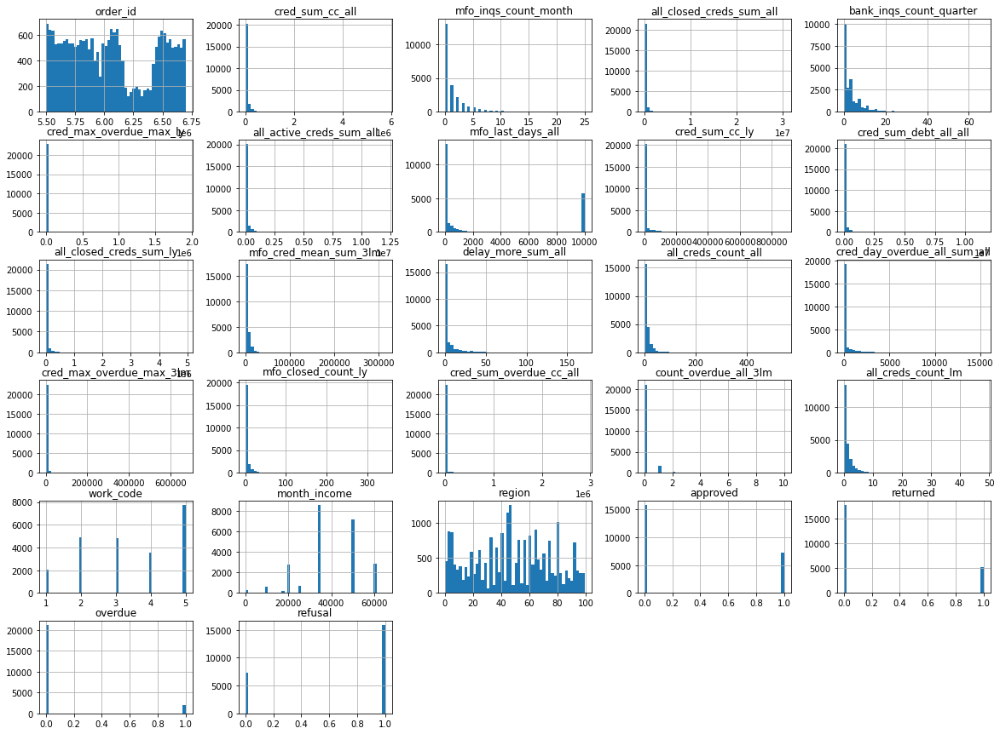

In [37]:
import matplotlib.pyplot as plt
%matplotlib inline

df_num.hist(figsize=(20,15), bins=50);

In [38]:
df_num.skew()

order_id                         0.218276
cred_sum_cc_all                 12.013648
mfo_inqs_count_month             3.360647
all_closed_creds_sum_all        16.921678
bank_inqs_count_quarter          2.671452
cred_max_overdue_max_ly         35.146795
all_active_creds_sum_all         8.295224
mfo_last_days_all                1.159635
cred_sum_cc_ly                   6.277718
cred_sum_debt_all_all           10.040731
all_closed_creds_sum_ly         14.217408
mfo_cred_mean_sum_3lm            9.782981
delay_more_sum_all               4.410490
all_creds_count_all              8.201599
cred_day_overdue_all_sum_all     5.436262
cred_max_overdue_max_3lm        52.419893
mfo_closed_count_ly              9.365255
cred_sum_overdue_cc_all         36.069266
count_overdue_all_3lm            7.293266
all_creds_count_lm               4.686976
work_code                       -0.240903
month_income                    -0.419453
region                          -0.031156
approved                         0

In [39]:
df_num.describe().T

,count,mean,std,min,25%,50%,75%,max
order_id,23116.0,6.060602e+06,367848.038073,5498546.0,5739749.0,6020793.5,6.445488e+06,6697265.00
cred_sum_cc_all,23116.0,4.424794e+04,100601.596651,0.0,0.0,5000.0,4.972685e+04,5739786.09
mfo_inqs_count_month,23116.0,1.284262e+00,2.373415,0.0,0.0,0.0,2.000000e+00,25.00
all_closed_creds_sum_all,23116.0,1.653574e+05,478894.221794,0.0,3000.0,30834.5,1.357758e+05,30309967.00
bank_inqs_count_quarter,23116.0,3.760642e+00,5.057107,0.0,0.0,2.0,5.000000e+00,67.00
cred_max_overdue_max_ly,23116.0,4.070925e+03,26890.422460,0.0,0.0,0.0,3.000000e+03,1914581.16
all_active_creds_sum_all,23116.0,1.284212e+05,389071.817759,0.0,2000.0,15000.0,7.500000e+04,12000000.00
mfo_last_days_all,23116.0,2.615989e+03,4228.621029,0.0,13.0,83.5,2.070500e+03,9999.00
cred_sum_cc_ly,23116.0,1.067210e+04,37246.943546,0.0,0.0,0.0,0.000000e+00,878000.00
cred_sum_debt_all_all,23116.0,8.414683e+04,305472.366723,0.0,0.0,5000.0,3.496056e+04,11508246.66


In [40]:
from pandas.plotting import scatter_matrix

In [41]:
df_num.columns[9]

'cred_sum_debt_all_all'

In [42]:
df_num.columns[6]

'all_active_creds_sum_all'

In [43]:
# scatter_matrix(df_num, figsize=(16, 10));

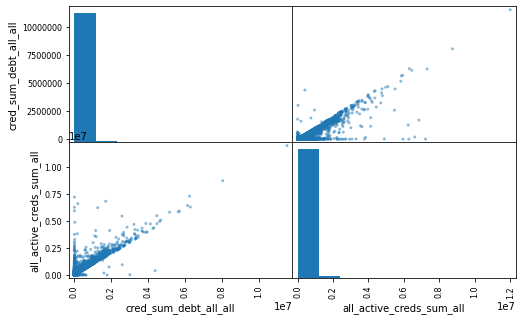

In [44]:
scatter_matrix(df_num[['cred_sum_debt_all_all', 'all_active_creds_sum_all']], figsize=(8, 5));
# Сумма задолженности по всем кредитам, денежная сумма всех активных кредитов

In [45]:
print(df_num.columns[15])
print(df_num.columns[5])

cred_max_overdue_max_3lm
cred_max_overdue_max_ly


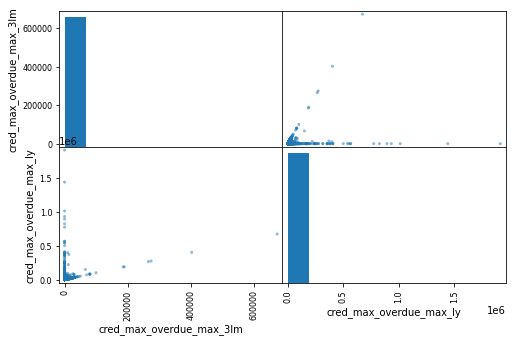

In [46]:
scatter_matrix(df_num[['cred_max_overdue_max_3lm', 'cred_max_overdue_max_ly']], figsize=(8, 5));

In [47]:
print(df_num.columns[16])
print(df_num.columns[13])

mfo_closed_count_ly
all_creds_count_all


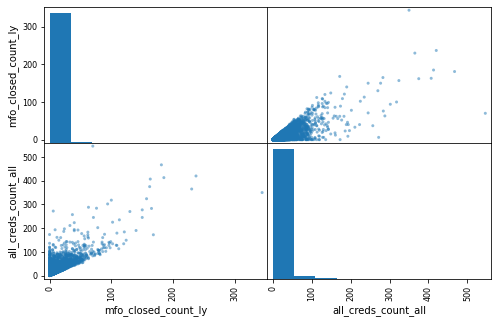

In [48]:
scatter_matrix(df_num[['mfo_closed_count_ly', 'all_creds_count_all']], figsize=(8, 5));

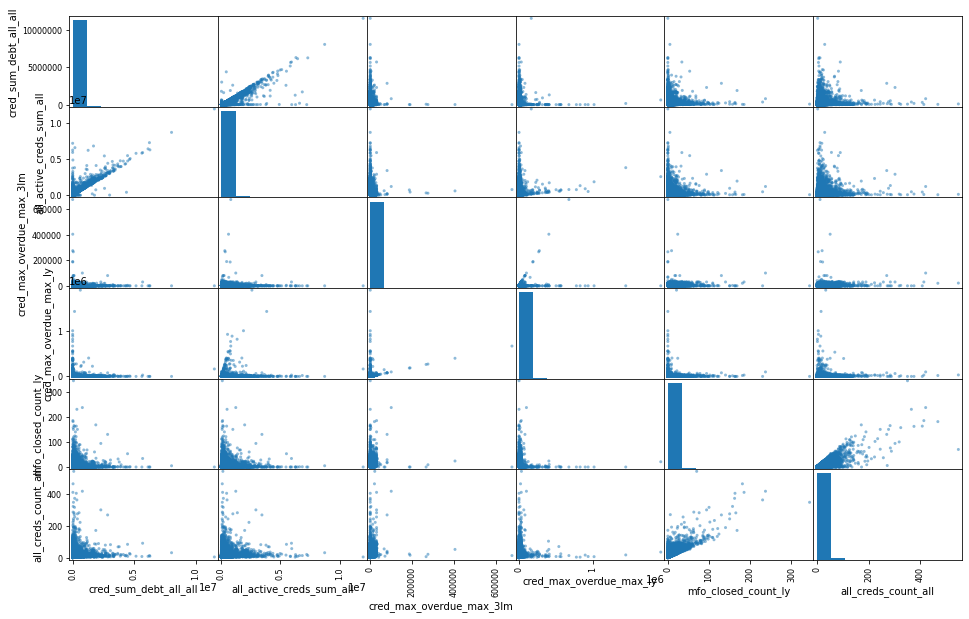

In [49]:
scatter_matrix(df_num[['cred_sum_debt_all_all',
                       'all_active_creds_sum_all',
                       'cred_max_overdue_max_3lm',
                       'cred_max_overdue_max_ly',
                       'mfo_closed_count_ly',
                       'all_creds_count_all']], figsize=(16, 10));

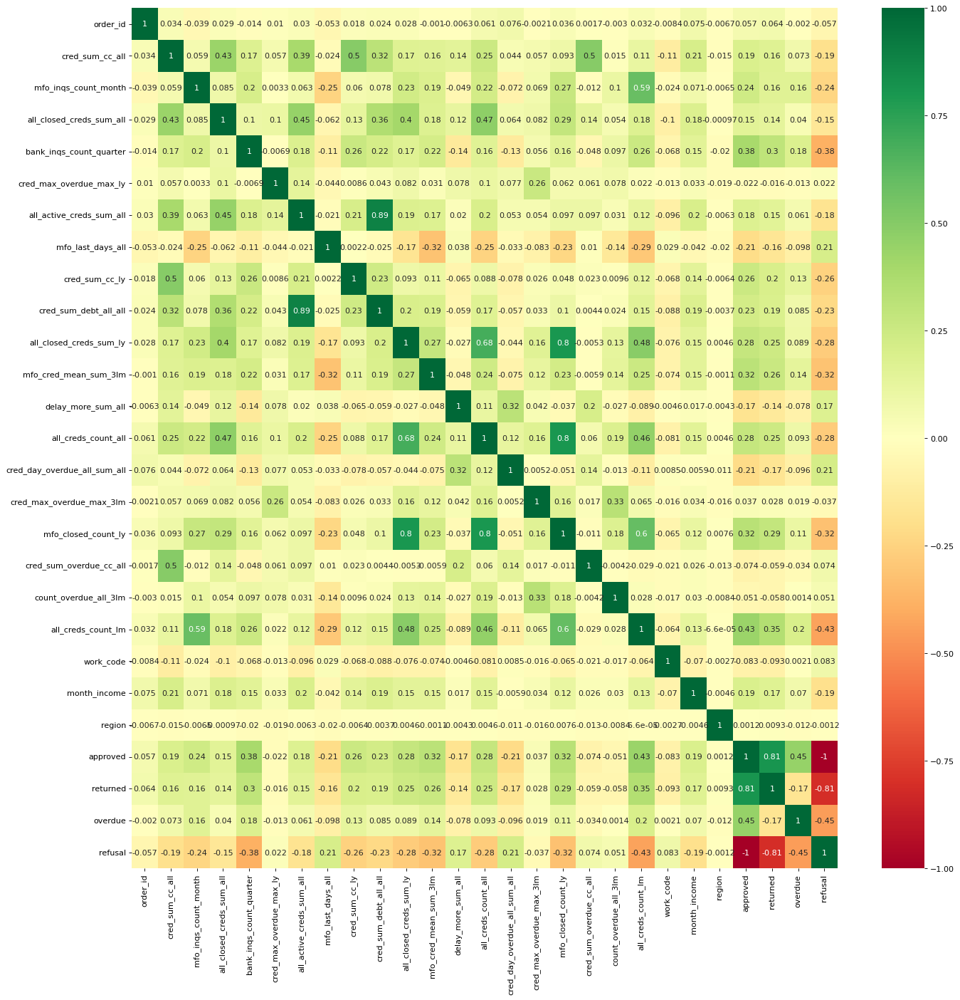

In [50]:
plt.figure(figsize=(20, 20), dpi= 80)
sns.heatmap(df2.corr(), xticklabels=df2.corr().columns,
            yticklabels=df2.corr().columns,
            cmap='RdYlGn',
            center=0,
            annot=True,
            fmt='.2g');

In [51]:
#fungsi untuk plotting
def num_eda(data,feature,target,bins ):
    df_set_pos = data[data[target] == True].drop(target,axis = 1)
    df_set_neg = data[data[target] == False].drop(target,axis = 1)
    #plot numerical data (Classification Task)
    fig, axes = plt.subplots(2,2,figsize = (18,4))

    ax1 = sns.histplot(x = feature,data = data,ax = axes[0,0],bins = bins,kde = True,edgecolor = "k",color = "orange")
    ax1.grid(linestyle='--', linewidth=0.5, color='gray')
    ax1.set_title(f"{feature} Distribution")
    
    ax2 = sns.histplot(x = feature,data = df_set_pos,ax = axes[0,1],bins = bins,label = "approved",kde = True,color = "green",linewidth = 0 )
    ax2_1 = sns.histplot(x = feature,data = df_set_neg,ax = axes[0,1],label = "Not - approved",bins = bins,kde = True,color = "red",linewidth = 0)
    ax2.grid(linestyle='--', linewidth=0.1, color='gray')
    ax2.set_title(f"{feature} Distribution by Target Class")
    ax2.legend()
    
    ax3 = sns.boxplot(x = feature,data = data,ax = axes[1,0],color = "orange")
    ax3.grid(linestyle='--', linewidth=0.5, color='gray')
    
    ax4 = sns.boxplot(x = feature,y = target,data = data,ax = axes[1,1],orient = "h",palette = ["red","green"])
    ax4.grid(linestyle='--', linewidth=0.1, color='gray')
    ax4.legend()

In [52]:
df2.columns

Index(['order_id', 'cred_sum_cc_all', 'mfo_inqs_count_month',
       'all_closed_creds_sum_all', 'bank_inqs_count_quarter',
       'cred_max_overdue_max_ly', 'all_active_creds_sum_all',
       'mfo_last_days_all', 'cred_sum_cc_ly', 'cred_sum_debt_all_all',
       'all_closed_creds_sum_ly', 'mfo_cred_mean_sum_3lm',
       'delay_more_sum_all', 'all_creds_count_all',
       'cred_day_overdue_all_sum_all', 'cred_max_overdue_max_3lm',
       'mfo_closed_count_ly', 'cred_sum_overdue_cc_all',
       'count_overdue_all_3lm', 'all_creds_count_lm', 'work_code',
       'month_income', 'region', 'approved', 'returned', 'overdue', 'refusal'],
      dtype='object')

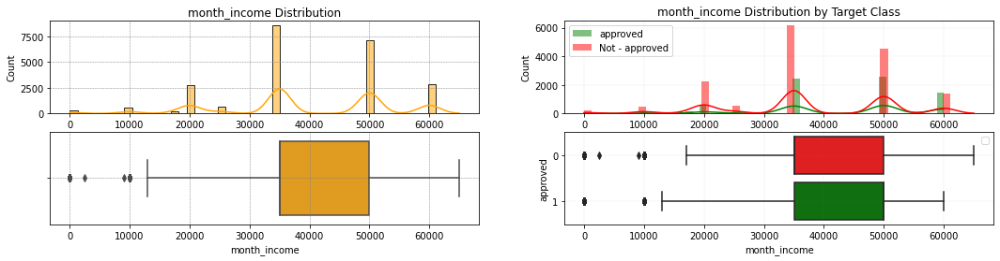

In [53]:
num_eda(df2, "month_income", "approved", 50)

In [54]:
df2.month_income.value_counts()

35000    8589
50000    7165
60000    2833
20000    2736
25000     666
10000     596
0         320
17000     200
40000       2
9000        1
13000       1
49000       1
14000       1
2500        1
45000       1
65000       1
30000       1
37000       1
Name: month_income, dtype: int64

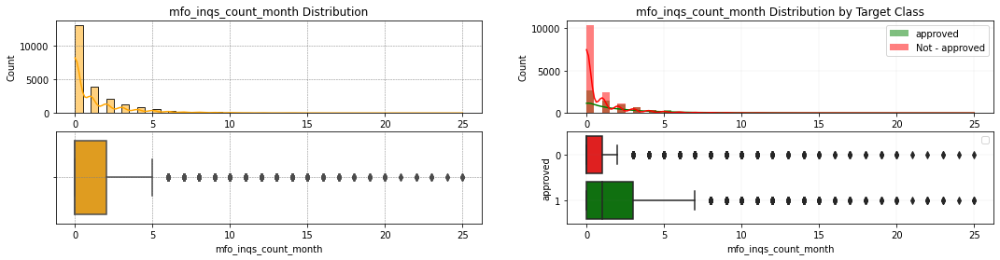

In [55]:
num_eda(df, "mfo_inqs_count_month", "approved", 50)

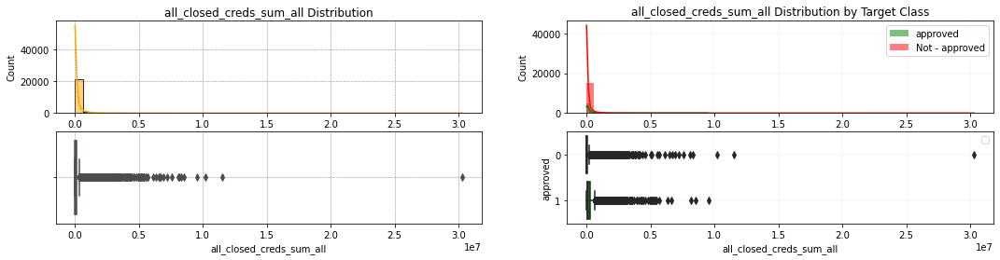

In [56]:
num_eda(df, "all_closed_creds_sum_all", "approved", 50)

## EDA 2

### гистограммы и корреляции

In [60]:
df2.head()

,order_id,cred_sum_cc_all,mfo_inqs_count_month,all_closed_creds_sum_all,bank_inqs_count_quarter,cred_max_overdue_max_ly,all_active_creds_sum_all,mfo_last_days_all,cred_sum_cc_ly,cred_sum_debt_all_all,...,cred_sum_overdue_cc_all,count_overdue_all_3lm,all_creds_count_lm,work_code,month_income,region,approved,returned,overdue,refusal
0,5498546,0.0,0,40364,0,0.0,3000,560,0.0,0.0,...,0.00,0,0,3,50000,46,0,0,0,1
1,5498604,1500.0,0,23456,0,0.0,0,9999,0.0,0.0,...,0.00,0,0,3,35000,17,0,0,0,1
2,5498609,0.1,0,17999,3,0.0,9999,9999,0.1,9999.0,...,0.00,0,2,3,35000,58,0,0,0,1
3,5498645,5000.0,0,313247,0,0.0,0,9999,0.0,0.0,...,4923.97,0,0,5,35000,4,0,0,0,1
4,5498647,0.0,0,0,1,0.0,0,9999,0.0,0.0,...,0.00,0,0,5,35000,34,0,0,0,1


In [62]:
df2.columns

Index(['order_id', 'cred_sum_cc_all', 'mfo_inqs_count_month',
       'all_closed_creds_sum_all', 'bank_inqs_count_quarter',
       'cred_max_overdue_max_ly', 'all_active_creds_sum_all',
       'mfo_last_days_all', 'cred_sum_cc_ly', 'cred_sum_debt_all_all',
       'all_closed_creds_sum_ly', 'mfo_cred_mean_sum_3lm',
       'delay_more_sum_all', 'all_creds_count_all',
       'cred_day_overdue_all_sum_all', 'cred_max_overdue_max_3lm',
       'mfo_closed_count_ly', 'cred_sum_overdue_cc_all',
       'count_overdue_all_3lm', 'all_creds_count_lm', 'work_code',
       'month_income', 'region', 'approved', 'returned', 'overdue', 'refusal'],
      dtype='object')

In [90]:
categorical = ['work_code','approved', 'returned', 'overdue', 'refusal']
numerical = ['cred_sum_cc_all', 'mfo_inqs_count_month',
       'all_closed_creds_sum_all', 'bank_inqs_count_quarter',
       'cred_max_overdue_max_ly', 'all_active_creds_sum_all',
       'mfo_last_days_all', 'cred_sum_cc_ly', 'cred_sum_debt_all_all',
       'all_closed_creds_sum_ly', 'mfo_cred_mean_sum_3lm',
       'delay_more_sum_all', 'all_creds_count_all',
       'cred_day_overdue_all_sum_all', 'cred_max_overdue_max_3lm',
       'mfo_closed_count_ly', 'cred_sum_overdue_cc_all',
       'count_overdue_all_3lm', 'all_creds_count_lm',
       'month_income', 'region']
interesting = ['cred_sum_overdue_cc_all', 'month_income', 'cred_sum_cc_all', 'approved']

In [100]:
df2.describe().T

,count,mean,std,min,25%,50%,75%,max
order_id,23116.0,6.060602e+06,367848.038073,5498546.0,5739749.0,6020793.5,6.445488e+06,6697265.00
cred_sum_cc_all,23116.0,4.424794e+04,100601.596651,0.0,0.0,5000.0,4.972685e+04,5739786.09
mfo_inqs_count_month,23116.0,1.284262e+00,2.373415,0.0,0.0,0.0,2.000000e+00,25.00
all_closed_creds_sum_all,23116.0,1.653574e+05,478894.221794,0.0,3000.0,30834.5,1.357758e+05,30309967.00
bank_inqs_count_quarter,23116.0,3.760642e+00,5.057107,0.0,0.0,2.0,5.000000e+00,67.00
cred_max_overdue_max_ly,23116.0,4.070925e+03,26890.422460,0.0,0.0,0.0,3.000000e+03,1914581.16
all_active_creds_sum_all,23116.0,1.284212e+05,389071.817759,0.0,2000.0,15000.0,7.500000e+04,12000000.00
mfo_last_days_all,23116.0,2.615989e+03,4228.621029,0.0,13.0,83.5,2.070500e+03,9999.00
cred_sum_cc_ly,23116.0,1.067210e+04,37246.943546,0.0,0.0,0.0,0.000000e+00,878000.00
cred_sum_debt_all_all,23116.0,8.414683e+04,305472.366723,0.0,0.0,5000.0,3.496056e+04,11508246.66


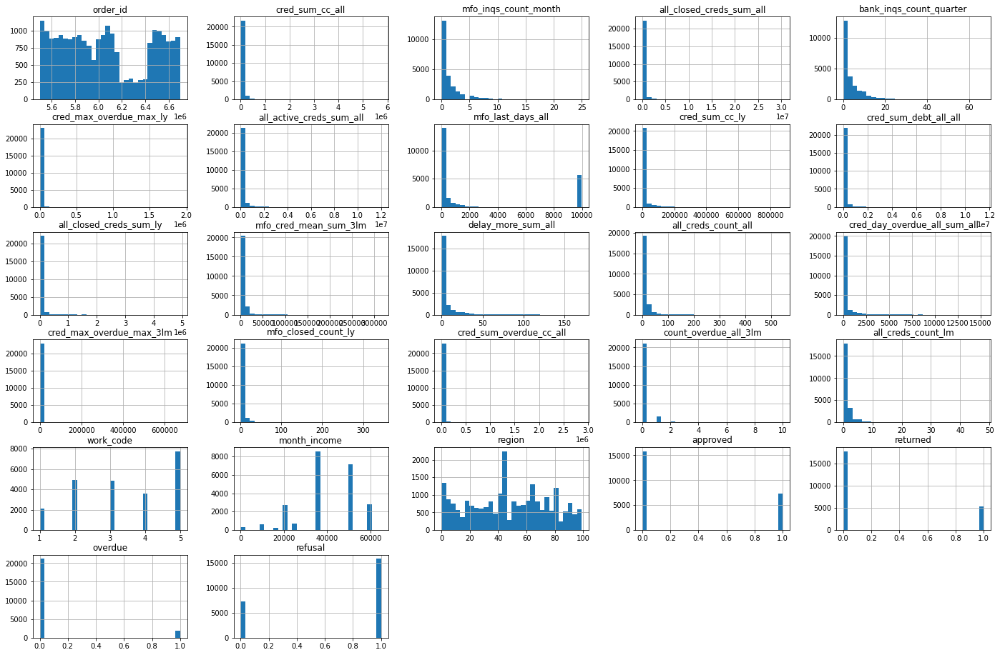

In [102]:
df2.hist(bins=30, figsize = (24, 16));

In [5]:
df2.skew().sort_values(ascending=False)

NameError: ignored

In [104]:
corr_matrix = df2.corr()

In [121]:
# 1st target (одобрено)
corr_matrix["approved"].sort_values(ascending=False)

approved                        1.000000
returned                        0.805912
overdue                         0.449791
all_creds_count_lm              0.432273
bank_inqs_count_quarter         0.383284
mfo_closed_count_ly             0.323730
mfo_cred_mean_sum_3lm           0.315625
all_creds_count_all             0.280020
all_closed_creds_sum_ly         0.279090
cred_sum_cc_ly                  0.255395
mfo_inqs_count_month            0.240049
cred_sum_debt_all_all           0.226264
cred_sum_cc_all                 0.193103
month_income                    0.191862
all_active_creds_sum_all        0.176089
all_closed_creds_sum_all        0.150458
order_id                        0.057191
cred_max_overdue_max_3lm        0.036980
region                          0.001223
cred_max_overdue_max_ly        -0.021931
count_overdue_all_3lm          -0.051477
cred_sum_overdue_cc_all        -0.074283
work_code                      -0.082536
delay_more_sum_all             -0.173997
mfo_last_days_al

Наибольшая корреляция `approved` с:
 * количество кредитов, взятых за последний месяц
 * кол-во запросов на кредиты в банки
 * кол-во закрытых МФО кредитов, взятых за
последний год

In [106]:
# 2nd target (возвращен)
corr_matrix["returned"].sort_values(ascending=False)

returned                        1.000000
approved                        0.805912
all_creds_count_lm              0.345324
bank_inqs_count_quarter         0.303929
mfo_closed_count_ly             0.286720
mfo_cred_mean_sum_3lm           0.258462
all_closed_creds_sum_ly         0.248852
all_creds_count_all             0.247337
cred_sum_cc_ly                  0.198917
cred_sum_debt_all_all           0.193375
month_income                    0.165162
cred_sum_cc_all                 0.164856
mfo_inqs_count_month            0.160617
all_active_creds_sum_all        0.154259
all_closed_creds_sum_all        0.139501
order_id                        0.064456
cred_max_overdue_max_3lm        0.028068
region                          0.009311
cred_max_overdue_max_ly        -0.015856
count_overdue_all_3lm          -0.057768
cred_sum_overdue_cc_all        -0.059465
work_code                      -0.092516
delay_more_sum_all             -0.140097
mfo_last_days_all              -0.163812
overdue         

Наибольшая корреляция с:
 * количество кредитов, взятых за последний месяц
 * кол-во запросов на кредиты в банки
 * кол-во закрытых МФО кредитов, взятых за
последний год

– тоже самое

In [107]:
# 3rd target (просрочен)
corr_matrix["overdue"].sort_values(ascending=False)

overdue                         1.000000
approved                        0.449791
all_creds_count_lm              0.199034
bank_inqs_count_quarter         0.179886
mfo_inqs_count_month            0.157516
mfo_cred_mean_sum_3lm           0.135786
cred_sum_cc_ly                  0.125298
mfo_closed_count_ly             0.106656
all_creds_count_all             0.093265
all_closed_creds_sum_ly         0.089431
cred_sum_debt_all_all           0.085138
cred_sum_cc_all                 0.072929
month_income                    0.070401
all_active_creds_sum_all        0.060577
all_closed_creds_sum_all        0.040151
cred_max_overdue_max_3lm        0.019250
work_code                       0.002098
count_overdue_all_3lm           0.001408
order_id                       -0.001982
region                         -0.012009
cred_max_overdue_max_ly        -0.012609
cred_sum_overdue_cc_all        -0.034017
delay_more_sum_all             -0.078458
cred_day_overdue_all_sum_all   -0.096429
mfo_last_days_al

In [111]:
# 4th target (отказано)
corr_matrix["refusal"].sort_values(ascending=False)

refusal                         1.000000
cred_day_overdue_all_sum_all    0.211764
mfo_last_days_all               0.207467
delay_more_sum_all              0.173997
work_code                       0.082536
cred_sum_overdue_cc_all         0.074283
count_overdue_all_3lm           0.051477
cred_max_overdue_max_ly         0.021931
region                         -0.001223
cred_max_overdue_max_3lm       -0.036980
order_id                       -0.057191
all_closed_creds_sum_all       -0.150458
all_active_creds_sum_all       -0.176089
month_income                   -0.191862
cred_sum_cc_all                -0.193103
cred_sum_debt_all_all          -0.226264
mfo_inqs_count_month           -0.240049
cred_sum_cc_ly                 -0.255395
all_closed_creds_sum_ly        -0.279090
all_creds_count_all            -0.280020
mfo_cred_mean_sum_3lm          -0.315625
mfo_closed_count_ly            -0.323730
bank_inqs_count_quarter        -0.383284
all_creds_count_lm             -0.432273
overdue         

Наибольшая корреляция `refusal` с:
 * Суммарное количество дней просрочки текущих активных кредитов
 * Количество дней с последнего займа в МФО
 * Количество просрочек более чем на 90 дней по всем кредитам

– Корреляция идентичная approved, только с другим знаком

### PyCaret

In [122]:
! pip install pycaret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 320 kB 4.9 MB/s 
     |████████████████████████████████| 2.0 MB 49.1 MB/s 
     |████████████████████████████████| 3.3 MB 28.3 MB/s 
     |████████████████████████████████| 167 kB 52.4 MB/s 
     |████████████████████████████████| 315 kB 48.7 MB/s 
     |████████████████████████████████| 636 kB 47.6 MB/s 
     |████████████████████████████████| 141 kB 61.3 MB/s 
     |████████████████████████████████| 88 kB 5.1 MB/s 
     |████████████████████████████████| 1.7 MB 55.4 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 4.8 MB 33.2 MB/s 
     |████████████████████████████████| 25.9 MB 32.7 MB/s 
     |████████████████████████████████| 56 kB 3.8 MB/s 
     |████████████████████████████████| 

In [26]:
df2 = pd.concat([df, df_cat3] , axis=1)
df2 = df2.drop(columns=['bad'])
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23116 entries, 0 to 23115
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   order_id                      23116 non-null  int64  
 1   cred_sum_cc_all               23116 non-null  float64
 2   mfo_inqs_count_month          23116 non-null  int64  
 3   all_closed_creds_sum_all      23116 non-null  int64  
 4   bank_inqs_count_quarter       23116 non-null  int64  
 5   cred_max_overdue_max_ly       23116 non-null  float64
 6   all_active_creds_sum_all      23116 non-null  int64  
 7   mfo_last_days_all             23116 non-null  int64  
 8   cred_sum_cc_ly                23116 non-null  float64
 9   cred_sum_debt_all_all         23116 non-null  float64
 10  all_closed_creds_sum_ly       23116 non-null  int64  
 11  mfo_cred_mean_sum_3lm         23116 non-null  float64
 12  delay_more_sum_all            23116 non-null  int64  
 13  a

In [1]:
from pycaret.classification import *

In [27]:
exp1 = setup(data = df2, target = 'approved', feature_selection=True, normalize=True, session_id = 123)

,Description,Value
0,session_id,123
1,Target,approved
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(23116, 27)"
5,Missing Values,False
6,Numeric Features,23
7,Categorical Features,3
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='approved',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_str...
                ('fix_perfect', Remove_100(target='approved')),
                ('clean_names', Clean_Colum_Names()),
                ('feature_select',
                 Adva

In [28]:
adaboost = create_model('ada')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0
5,1.0,1.0,1.0,1.0,1.0,1.0,1.0
6,1.0,1.0,1.0,1.0,1.0,1.0,1.0
7,1.0,1.0,1.0,1.0,1.0,1.0,1.0
8,1.0,1.0,1.0,1.0,1.0,1.0,1.0


INFO:logs:create_model_container: 1
INFO:logs:master_model_container: 1
INFO:logs:display_container: 2
INFO:logs:AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=123)
INFO:logs:create_model() succesfully completed......................................


In [29]:
from pycaret.clustering import *

In [31]:
exp2 = setup(data = df2,
            #  target = 'approved',
            #  feature_selection=True,
             normalize=True,
            #  session_id = 123
)

,Description,Value
0,session_id,5603
1,Original Data,"(23116, 27)"
2,Missing Values,False
3,Numeric Features,23
4,Categorical Features,4
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(23116, 59)"
9,CPU Jobs,-1


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='UNSUPERVISED_DUMMY_TARGET',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='most frequent',
                                fill_value_categorical=None,
                                fill_value_numerical=None...
                ('P_transform', 'passthrough'), ('binn', 'passthrough'),
                ('rem_outliers', 'passthrough'), ('cluster_all', 'passthrough'),
                ('dummy', Dummify(target='UNSUPERVIS

In [32]:
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1694,2070.862,2.0555,0,0,0


INFO:logs:create_model_container: 1
INFO:logs:master_model_container: 1
INFO:logs:display_container: 2
INFO:logs:KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=5603, tol=0.0001, verbose=0)
INFO:logs:create_model() succesfully completed......................................


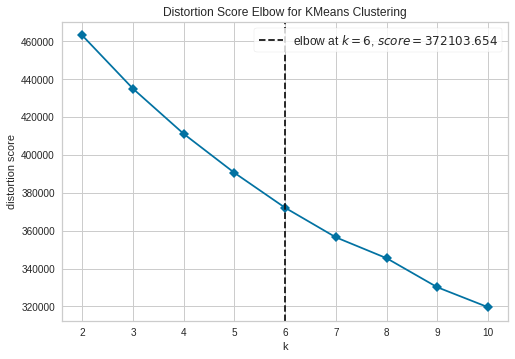

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [34]:
plot_model(kmeans, plot='elbow')

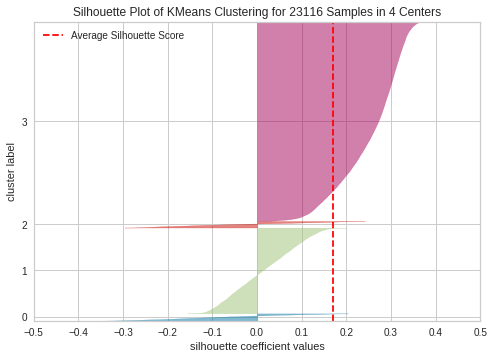

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [36]:
plot_model(kmeans, plot='silhouette')

In [37]:
plot_model(kmeans, plot='cluster')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [38]:
plot_model(kmeans, plot='distribution')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [39]:
plot_model(kmeans, plot='distribution', feature='month_income')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [40]:
plot_model(kmeans, plot='distribution', feature='work_code')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [41]:
km_df = assign_model(kmeans)

INFO:logs:Initializing assign_model()
INFO:logs:assign_model(model=KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=5603, tol=0.0001, verbose=0), transformation=False, score=True, verbose=True)
INFO:logs:Checking exceptions
INFO:logs:Determining Trained Model
INFO:logs:Trained Model : K-Means Clustering
INFO:logs:Copying data
INFO:logs:(23116, 28)
INFO:logs:assign_model() succesfully completed......................................


In [42]:
km_df.head()

,order_id,cred_sum_cc_all,mfo_inqs_count_month,all_closed_creds_sum_all,bank_inqs_count_quarter,cred_max_overdue_max_ly,all_active_creds_sum_all,mfo_last_days_all,cred_sum_cc_ly,cred_sum_debt_all_all,...,count_overdue_all_3lm,all_creds_count_lm,work_code,month_income,region,approved,returned,overdue,refusal,Cluster
0,5498546,0.0,0,40364,0,0.0,3000,560,0.0,0.0,...,0,0,3,50000,46,0,0,0,1,Cluster 3
1,5498604,1500.0,0,23456,0,0.0,0,9999,0.0,0.0,...,0,0,3,35000,17,0,0,0,1,Cluster 3
2,5498609,0.1,0,17999,3,0.0,9999,9999,0.1,9999.0,...,0,2,3,35000,58,0,0,0,1,Cluster 3
3,5498645,5000.0,0,313247,0,0.0,0,9999,0.0,0.0,...,0,0,5,35000,4,0,0,0,1,Cluster 3
4,5498647,0.0,0,0,1,0.0,0,9999,0.0,0.0,...,0,0,5,35000,34,0,0,0,1,Cluster 3


In [44]:
km_df.Cluster.value_counts()

Cluster 3    15413
Cluster 1     6633
Cluster 0      565
Cluster 2      505
Name: Cluster, dtype: int64